# Build a classification decision tree
We will demonstrate how to fit a decision tree with a simple classification problem using the breast cancer dataset.  
The aim is to predict the novelty level of a dashboards using its design caracteristics.  


## Loading and describing data

In [1]:
import pandas as pd
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import numpy
import os

In [2]:
path = r"D:\Etudes\CS\3A\2_DS\6_Data Driven Design\Cours 3"
filename = 'Dashboards_cleaned_data' + '.xlsx'
file_path = r"%s\%s" % (path, filename)

data = pd.read_excel(file_path)

In [3]:
data.head(3)

,Dashboards,Speedometer Dial position,Display lay-out,Air conditioner control,Air vent shape,Dashboard color,Aerator Shape,Arrangement space,Style lay-out,Space organization,Control comprehensibility,Aerator lay-out,Arrangement space perception,Comfort,Simplicity,Sportive lay-out,Masculinity,Quality,Novelty,Harmony
0,AUDI A2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,1.450467,0.274412,0.508663,1.195646,0.994656,1.387392,0.935571,1.832030,1.522825,0.659925,0.621599
1,AUDI A2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,1.494907,0.542454,0.913278,1.658658,0.878994,1.500000,0.781624,1.324876,0.934648,0.349055,0.550753
2,AUDI A2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,1.218555,0.251733,0.508663,1.213164,0.621023,0.685520,1.102452,2.376149,1.596414,0.557546,0.782384


In [4]:
print(f'The dimension of the data is {data.shape}')

The dimension of the data is (2000, 20)


In [5]:
data.columns

Index(['Dashboards', 'Speedometer Dial position', 'Display lay-out',
       'Air conditioner control', 'Air vent shape', 'Dashboard color',
       'Aerator Shape', 'Arrangement space', 'Style lay-out',
       'Space organization', 'Control comprehensibility', 'Aerator lay-out',
       'Arrangement space perception', 'Comfort', 'Simplicity',
       'Sportive lay-out', 'Masculinity', 'Quality', 'Novelty', 'Harmony'],
      dtype='object')

In [6]:
data.isnull().values.any()

False

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Dashboards                    2000 non-null   object 
 1   Speedometer Dial position     2000 non-null   object 
 2   Display lay-out               2000 non-null   object 
 3   Air conditioner control       2000 non-null   object 
 4   Air vent shape                2000 non-null   object 
 5   Dashboard color               2000 non-null   object 
 6   Aerator Shape                 2000 non-null   object 
 7   Arrangement space             2000 non-null   object 
 8   Style lay-out                 2000 non-null   object 
 9   Space organization            2000 non-null   float64
 10  Control comprehensibility     2000 non-null   float64
 11  Aerator lay-out               2000 non-null   float64
 12  Arrangement space perception  2000 non-null   float64
 13  Com

In [8]:
print('Data description:\n')
data.describe()

Data description:



,Space organization,Control comprehensibility,Aerator lay-out,Arrangement space perception,Comfort,Simplicity,Sportive lay-out,Masculinity,Quality,Novelty,Harmony
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,0.898374,0.913206,0.900610,0.996713,0.955681,0.978712,0.948358,0.922245,0.979715,1.138633,0.899086
std,0.338004,0.403945,0.355042,0.384170,0.261603,0.358203,0.310138,0.516643,0.308901,0.546608,0.260939
min,0.197665,0.111587,0.167909,0.359269,0.391805,0.297023,0.365789,0.144708,0.366294,0.199110,0.264765
25%,0.667290,0.589801,0.667232,0.679340,0.752706,0.703971,0.727485,0.543138,0.761250,0.680563,0.713488
50%,0.877256,0.859786,0.880104,0.918262,0.941387,0.959794,0.920509,0.805968,0.929531,0.996362,0.888472
75%,1.066409,1.215407,1.108257,1.290596,1.140056,1.196055,1.119008,1.180366,1.100000,1.555750,1.068049
max,1.796078,2.046427,1.932636,2.367078,2.400509,2.450408,2.541265,2.724929,2.051305,2.500000,1.495300


In [9]:
import seaborn as sns

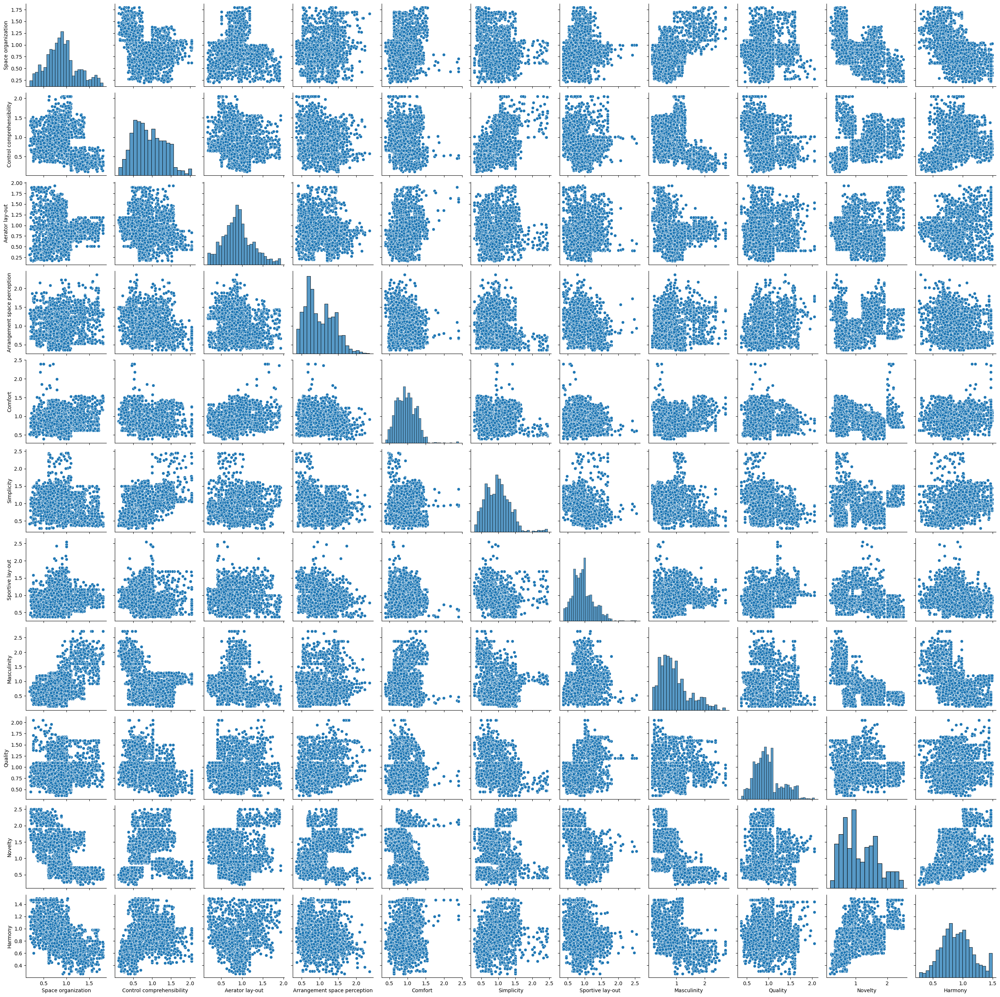

In [10]:
sns.pairplot(data)

In [11]:
import hvplot.pandas
data.hvplot.scatter(x='Novelty')

:NdOverlay   [Variable]
   :Scatter   [Novelty]   (value)

In [12]:
data.hvplot.hist("Novelty")

:Histogram   [Novelty]   (Novelty_count)

In [13]:
data.hvplot.hist('Novelty', by='Dashboards', subplots=True, width=500)

:NdLayout   [Dashboards]
   :Histogram   [Novelty]   (Novelty_count)

In [14]:
data.hvplot.scatter(x='Dashboards', y='Novelty')

:Scatter   [Dashboards]   (Novelty)

<Axes: xlabel='Novelty', ylabel='Dashboards'>

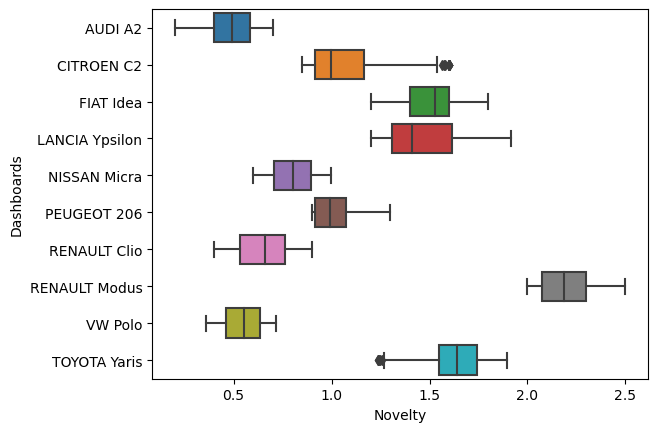

In [15]:
sns.boxplot(y='Dashboards',x='Novelty',data=data)

C:\Users\salom\AppData\Local\Temp\ipykernel_27232\3056385833.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True)


<Axes: >

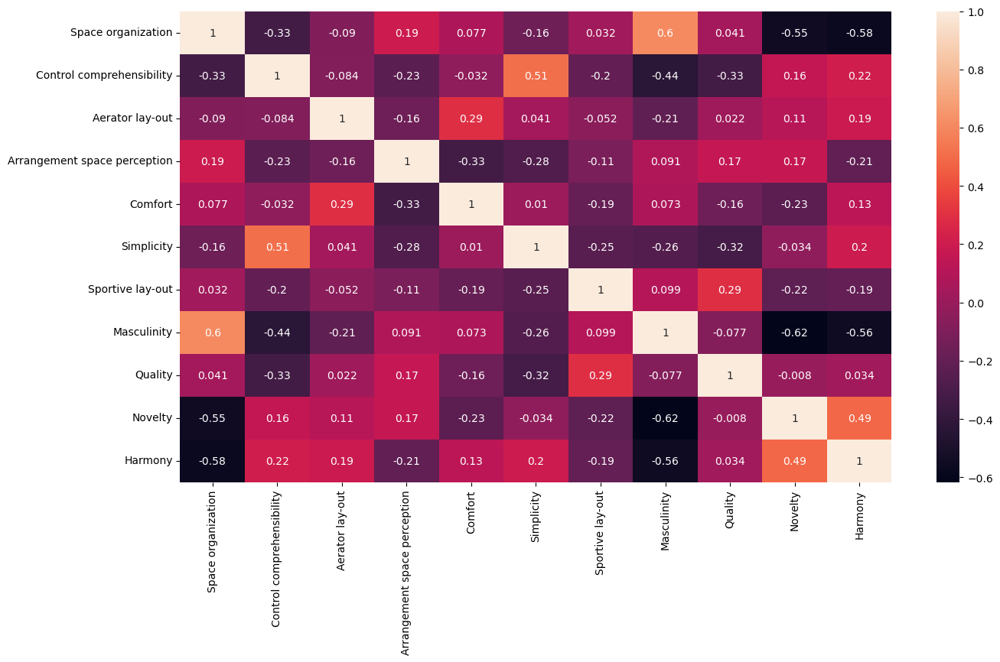

In [16]:
plt.figure(figsize = (15,8))
sns.heatmap(data.corr(), annot=True)

## Define the predictor variables xi and the target variable y

The aim he is to create a Kansei (emotional) model, which will allow us to translate human sensibility and images into physical design factorsand vice versa.
We will focus here on the Novelty as a target. then, we will consider the technical variable as predictors.  
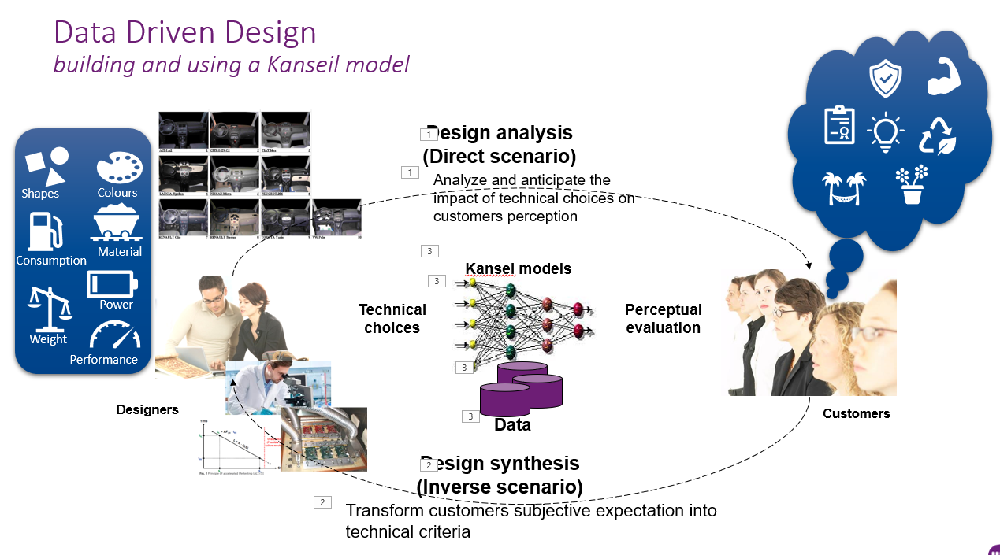

In [17]:
data_select = data[['Speedometer Dial position', 'Display lay-out',
       'Air conditioner control', 'Air vent shape', 'Dashboard color',
       'Aerator Shape', 'Arrangement space', 'Style lay-out','Novelty']]
data_select.head(5)

,Speedometer Dial position,Display lay-out,Air conditioner control,Air vent shape,Dashboard color,Aerator Shape,Arrangement space,Style lay-out,Novelty
0,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.659925
1,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.349055
2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.557546
3,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.663976
4,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines,0.700000


In [18]:
data_dummy = pd.get_dummies(data=data_select, drop_first=True)
data_dummy

,Novelty,Speedometer Dial position_behind steering wheel,Display lay-out_digital,Air conditioner control_other,Air vent shape_square,Dashboard color_two colours,Aerator Shape_square,Arrangement space_many,Style lay-out_curved lines
0,0.659925,1,0,0,1,0,1,1,0
1,0.349055,1,0,0,1,0,1,1,0
2,0.557546,1,0,0,1,0,1,1,0
3,0.663976,1,0,0,1,0,1,1,0
4,0.700000,1,0,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...
1995,1.787473,0,1,1,0,0,0,1,1
1996,1.698660,0,1,1,0,0,0,1,1
1997,1.638713,0,1,1,0,0,0,1,1
1998,1.626888,0,1,1,0,0,0,1,1


In [19]:
data.hvplot.scatter(x='Dashboards', y='Novelty')

:Scatter   [Dashboards]   (Novelty)

In [20]:
y = data_select['Novelty']

Lower_bound = y.quantile(.25)
Upper_bound = y.quantile(.75)
print('Low_bound: ',Lower_bound)
print('High_bound: ',Upper_bound)

Low_bound:  0.68056298675
High_bound:  1.55575014275


In [21]:
Lower_bound = 0.7
Upper_bound = 2

In [22]:
import numpy as np
bins = [-np.inf, Lower_bound, Upper_bound, np.inf]
names = ['Low', 'Medium', 'High']
data_dummy = pd.get_dummies(data=data_select, drop_first=True)
data_select_dummy = data_dummy
data_select_dummy['Novelty'] = pd.cut(data_dummy['Novelty'], bins, labels=names)
#data_dummy['Novelty2']=data['Novelty']
data_select_dummy

,Novelty,Speedometer Dial position_behind steering wheel,Display lay-out_digital,Air conditioner control_other,Air vent shape_square,Dashboard color_two colours,Aerator Shape_square,Arrangement space_many,Style lay-out_curved lines
0,Low,1,0,0,1,0,1,1,0
1,Low,1,0,0,1,0,1,1,0
2,Low,1,0,0,1,0,1,1,0
3,Low,1,0,0,1,0,1,1,0
4,Low,1,0,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...
1995,Medium,0,1,1,0,0,0,1,1
1996,Medium,0,1,1,0,0,0,1,1
1997,Medium,0,1,1,0,0,0,1,1
1998,Medium,0,1,1,0,0,0,1,1


On a attribue pour la variable Novelty l'une des trois valeurs 'Low, 'Medium' ou 'High' en fonction des seuils définis dans la variables bins (bacs) grâe à la fonction pd.cut. La variable Novelty n'est plus une valeur numérique mais de type object pouvant prendre trois valeurs différentes.

In [23]:
X_features = data_select_dummy.loc[:, data_select_dummy.columns != 'Novelty']
y_target=data_select_dummy['Novelty']

Now, let's check the partition of the target lables 

In [24]:
print('The count of observation by label classes is: \n',y_target.value_counts())
print('The absolut distribution of classes is: \n',y_target.value_counts(normalize=True))

The count of observation by label classes is: 
 Medium    1277
Low        545
High       178
Name: Novelty, dtype: int64
The absolut distribution of classes is: 
 Medium    0.6385
Low       0.2725
High      0.0890
Name: Novelty, dtype: float64


64% des clients ont attribué, sur les modèles proposés, une note à la nouveauté comprise entre 0,7 et 2, 27% inférieur à 0,2 et 9% supérieur à 2. Les classes 'Low', 'Medium' et 'High' ne sont pas aussi denses les unes que les autres.

## Main steps to build ML model  
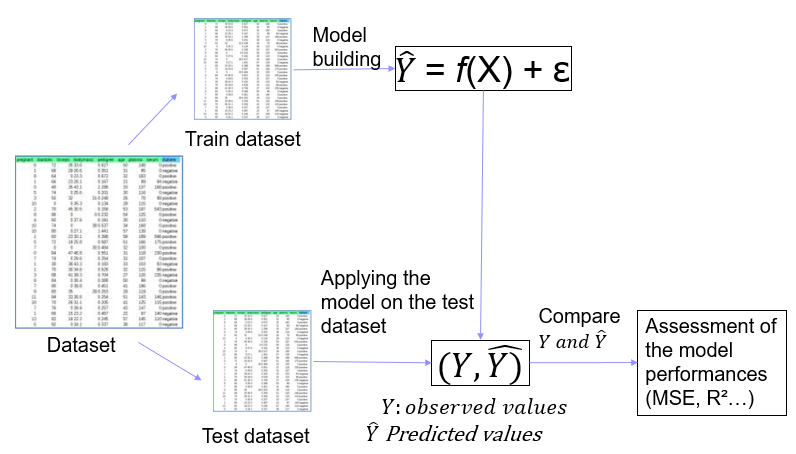

In [25]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_features, y_target, test_size=0.3, random_state=42)

In [26]:
print(f'The dimensions of the training data are {X_train.shape}')
print(f'The dimensions of the training target data are {y_train.shape}')
print(f'The dimensions of the testing data are {X_test.shape}')
print(f'The dimensions of the testing traget are {y_test.shape}')

The dimensions of the training data are (1400, 8)
The dimensions of the traing target data are (1400,)
The dimensions of the testing data are (600, 8)
The dimensions of the testing traget are (600,)


In [27]:
print('The absolut distribution of classes in the train set is: \n',y_train.value_counts(normalize=True))
print('The absolut distribution of classes in the test set is: \n',y_test.value_counts(normalize=True))

The absolut distribution of classes in the train set is: 
 Medium    0.630714
Low       0.281429
High      0.087857
Name: Novelty, dtype: float64
The absolut distribution of classes in the test set is: 
 Medium    0.656667
Low       0.251667
High      0.091667
Name: Novelty, dtype: float64


La distribution de la nouveauté est similaire dans les dataset d'entraînement et de test du modèle. L'équilibre des classes est donc préservé.

In [28]:
from sklearn.tree import DecisionTreeClassifier

arbreSecond = DecisionTreeClassifier(min_samples_split=30,#The minimum number of samples required to split an internal node
                                     min_samples_leaf=3)#The minimum number of samples required to be at a leaf node.

arbreSecond.fit(X = X_train, y = y_train)

DecisionTreeClassifier(min_samples_leaf=3, min_samples_split=30)

In [29]:
y_train.unique()

['Medium', 'High', 'Low']
Categories (3, object): ['Low' < 'Medium' < 'High']

In [30]:
class_names_alphabetic = ['High', 'Low', 'Medium']

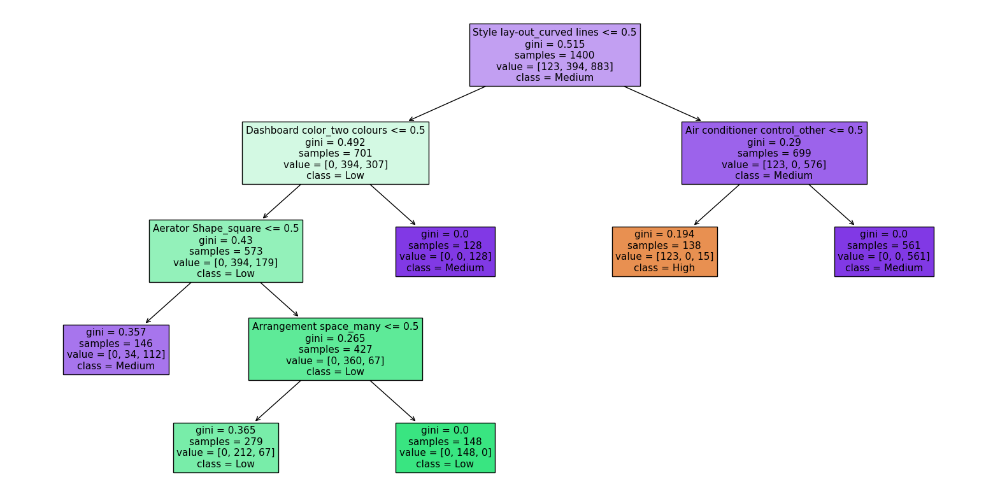

In [31]:
#Plot the tree
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(20,10))

plot_tree(arbreSecond,
          feature_names = X_train.columns,
          class_names=class_names_alphabetic,
          filled=True,
          fontsize=11)

plt.show()
#fig.savefig('comparison.png', dpi=200, transparent=False) 

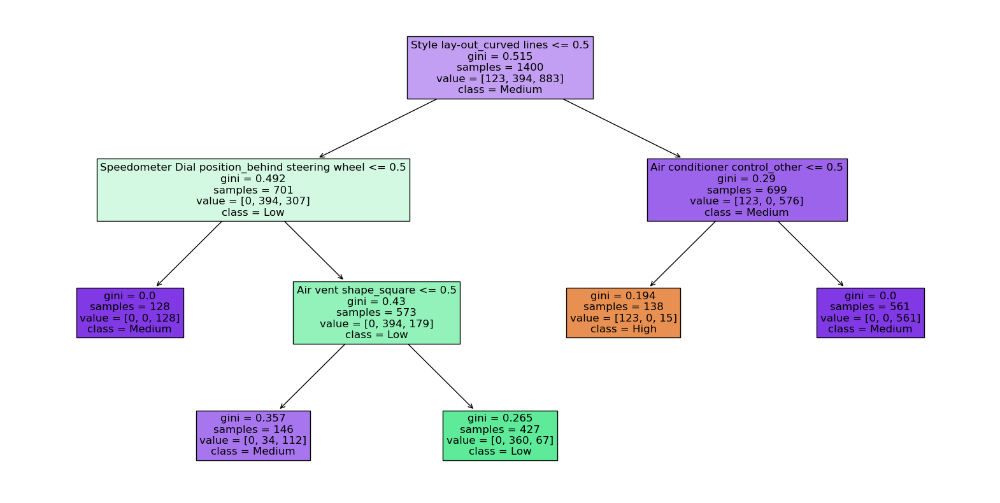

In [32]:
arbreThird = DecisionTreeClassifier(min_samples_split=30,#The minimum number of samples required to split an internal node
                                    min_samples_leaf=3,#The minimum number of samples required to be at a leaf node.
                                    max_leaf_nodes=5)#Grow trees with max_leaf_nodes in best-first fashion. Best nodes are defined as relative reduction in impurity
arbreThird.fit(X = X_train, y = y_train)

fig = plt.figure(figsize=(20,10))
plot_tree(arbreThird,
          feature_names = X_train.columns,
          class_names=class_names_alphabetic,
          filled=True,
          fontsize=12)

plt.show()

In [33]:
y_train.value_counts()

Medium    883
Low       394
High      123
Name: Novelty, dtype: int64

### How to interpret a decision Tree

### Display rules  in text format

In [54]:
from sklearn.tree import export_text
tree_rules = export_text(arbreThird,feature_names = list(X_train.columns),show_weights=True)
print(tree_rules)

|--- Style lay-out_curved lines <= 0.50
|   |--- Speedometer Dial position_behind steering wheel <= 0.50
|   |   |--- weights: [0.00, 0.00, 128.00] class: Medium
|   |--- Speedometer Dial position_behind steering wheel >  0.50
|   |   |--- Air vent shape_square <= 0.50
|   |   |   |--- weights: [0.00, 34.00, 112.00] class: Medium
|   |   |--- Air vent shape_square >  0.50
|   |   |   |--- weights: [0.00, 360.00, 67.00] class: Low
|--- Style lay-out_curved lines >  0.50
|   |--- Air conditioner control_other <= 0.50
|   |   |--- weights: [123.00, 0.00, 15.00] class: High
|   |--- Air conditioner control_other >  0.50
|   |   |--- weights: [0.00, 0.00, 561.00] class: Medium



Les règles sont affichées en format texte et permettent de déterminer la niveau de Nouveauté en fonction de la valeur des paramètres. Ainsi si le style lay-out a la valeur 'curved lines', et le Air conditioner control a la valeur 'other', alors la classe de nouveauté associée sera Medium, avec un poids de 561 contre 0 pour High et Low.

# Assessing the model

In [35]:
predFirst = arbreThird.predict(X=X_test)

In [36]:
import numpy
print(numpy.unique(predFirst,return_counts=True))

(array(['High', 'Low', 'Medium'], dtype=object), array([ 62, 173, 365], dtype=int64))


In [37]:
from sklearn import metrics
print(metrics.confusion_matrix(y_test,predFirst))

[[ 55   0   0]
 [  0 138  13]
 [  7  35 352]]


La matrice de confusion permet d'estimer les erreurs du modèle, qui correspondent aux coefficients situés en dehors de la diagonale. Par exemple, 13 éléments de la classe 'Medium' ont été associés à la classe 'Low' par le modèle. 35 éléments de la classe 'Medium' ont été associés à la classe 'Low'. Il y a donc quelques erreurs.

## Calculate key metrics 

In [38]:
print(metrics.classification_report(y_test,predFirst))

              precision    recall  f1-score   support

        High       0.89      1.00      0.94        55
         Low       0.80      0.91      0.85       151
      Medium       0.96      0.89      0.93       394

    accuracy                           0.91       600
   macro avg       0.88      0.94      0.91       600
weighted avg       0.92      0.91      0.91       600



### Model accuracy

Le modèle a correctement prédit 92% des données lors du test.

### Model recall for a given label

L'algorithme a identifié 100% des éléments effectivement 'High', 91% des éléments effectivement 'Low' et 89% des éléments effectivement 'Medium'.

### Precision related to a given label

89% des prédictions 'High', 80% des prédictions 'Low' et 96% des prédictions 'Medium' sont correctes.

### F1-Score

Le F1-Score qualifie l'équilibre entre précision et rappel pour une classe donnée. Par exemple, pour 'High' et 'Medium', le score de 0,93 et 0,94 montrent que le modèle identifie une bonne proportion de vrais positifs et que ses identifications sont correctes dans la majorité des cas.
C'est moins le cas pour la classe 'Low', pour laquelle le modèle est donc moins performant.

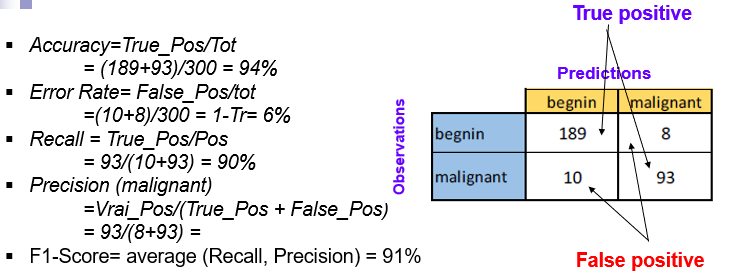

# Random forest trees

### Random Forest Classifier

As the Tree classifer we used above, the Random Forest Classifier requires a categorical variable as target variable.
see this link for more information https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

In [39]:
from sklearn.ensemble import RandomForestClassifier
random_forest = RandomForestClassifier(n_estimators=50, #the number of trees in the forest to be created
                                       random_state=0, #to get the same train and test sets across different executions
                                       min_samples_split=30, #The minimum number of samples required to split an internal node
                                        min_samples_leaf=3, #The minimum number of samples required to be at a leaf node.
                                        max_leaf_nodes=5) #Grow trees with max_leaf_nodes in best-first fashion. Best nodes are defined as relative reduction in impurity

In [40]:
random_forest.fit(X = X_train, y = y_train)

RandomForestClassifier(max_leaf_nodes=5, min_samples_leaf=3,
                       min_samples_split=30, n_estimators=50, random_state=0)

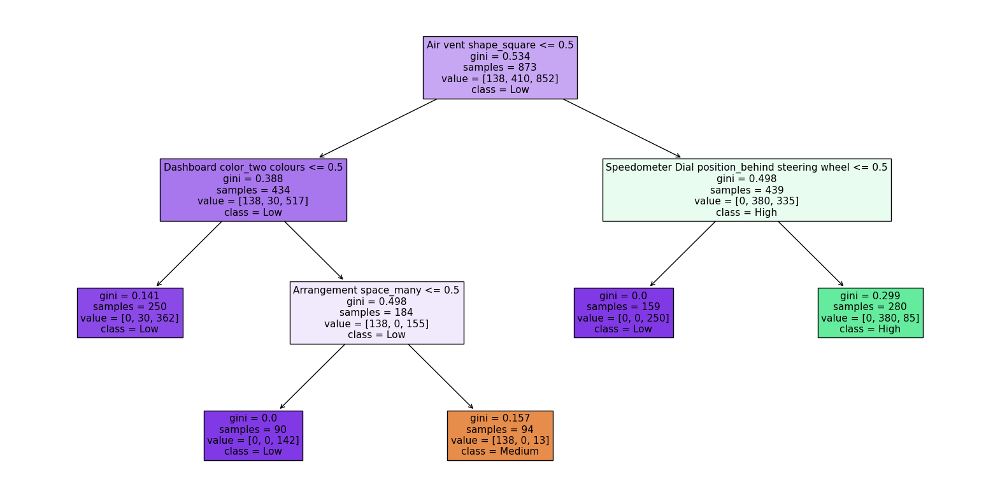

In [41]:
fig = plt.figure(figsize=(20,10))
plot_tree(random_forest.estimators_[0],
          feature_names = X_train.columns,
          class_names=y_train.unique(),
          filled=True,
          fontsize=11)

plt.show()
#fig.savefig('comparison.png', dpi=200, transparent=False) 

### Random Forest Regressor

In [42]:
X = data[['Speedometer Dial position', 'Display lay-out',
       'Air conditioner control', 'Air vent shape', 'Dashboard color',
       'Aerator Shape', 'Arrangement space', 'Style lay-out']]
y = data['Novelty']
X.head(3)

,Speedometer Dial position,Display lay-out,Air conditioner control,Air vent shape,Dashboard color,Aerator Shape,Arrangement space,Style lay-out
0,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines
1,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines
2,behind steering wheel,analogue,button,square,signle colour,square,many,Straight lines


In [43]:
X = pd.get_dummies(data=X, drop_first=True)

In [44]:
X.head(3)

,Speedometer Dial position_behind steering wheel,Display lay-out_digital,Air conditioner control_other,Air vent shape_square,Dashboard color_two colours,Aerator Shape_square,Arrangement space_many,Style lay-out_curved lines
0,1,0,0,1,0,1,1,0
1,1,0,0,1,0,1,1,0
2,1,0,0,1,0,1,1,0


Now, let's split our data into a train and test sets

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print(f'The dimensions of the training data are {X_train.shape}')
print(f'The dimensions of the testing data are {X_test.shape}')

The dimensions of the training data are (1400, 8)
The dimensions of the testing data are (600, 8)


In [46]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators = 100, random_state = 2020)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=2020)

#### Random Forest: Feature importance based on mean decrease in impurity
see this link for more details https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html
Feature importances are provided by the fitted attribute feature_importances_ and they are computed as the mean and standard deviation of accumulation of the impurity decrease within each tree.

Warning:  Impurity-based feature importances can be misleading for high cardinality features (many unique values). See Permutation feature importance as an alternative below.

Text(0.5, 0, 'Relative Importance')

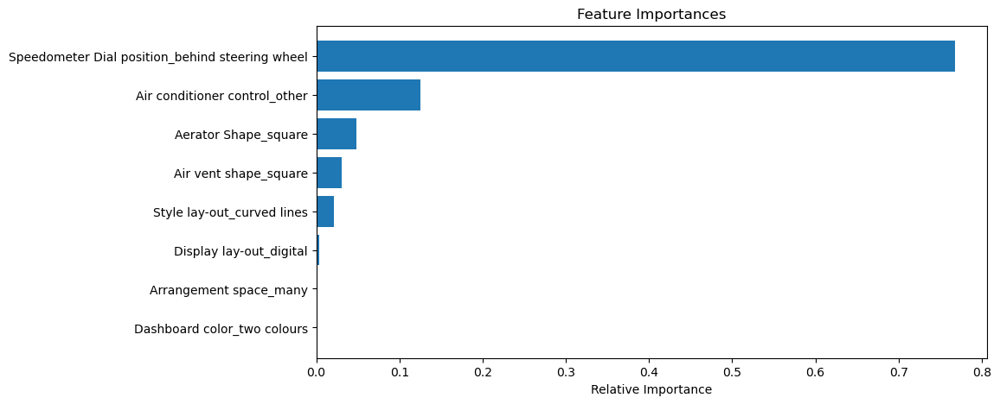

In [47]:
importances = rf.feature_importances_
sorted_idx = rf.feature_importances_.argsort()
plt.figure(figsize=(10,5))
plt.title('Feature Importances')
plt.barh(X_test.columns[sorted_idx], rf.feature_importances_[sorted_idx])
plt.xlabel('Relative Importance')

La variable Sppedometer Dial position a une importance prépondérante par rapport aux autres variables dans la construction de la forêt aléatoire.

#### Feature importance, taking into account their dispesion

In [48]:
import time
import numpy as np
forest = rf
start_time = time.time()
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.015 seconds


Text(0, 0.5, 'Mean decrease in impurity')

<Figure size 1000x2000 with 0 Axes>

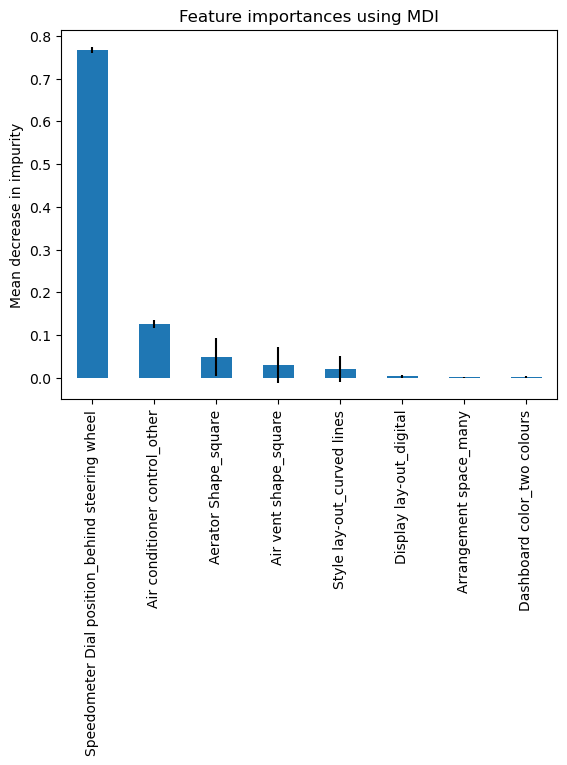

In [49]:
import pandas as pd
fig = plt.figure(figsize=(10,20))
forest_importances = pd.Series(importances, index=X_train.columns).sort_values(ascending=False)
sorted_index = forest_importances.index
std2 = pd.Series(std, index=X_train.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std2[sorted_index], ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

Permutation feature importance overcomes limitations of the impurity-based feature importance: they do not have a bias toward high-cardinality features and can be computed on a left-out test set.

In [50]:
from sklearn.inspection import permutation_importance

feature_names = X_test.columns
start_time = time.time()
result = permutation_importance(
    forest, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=feature_names)

Elapsed time to compute the importances: 5.319 seconds


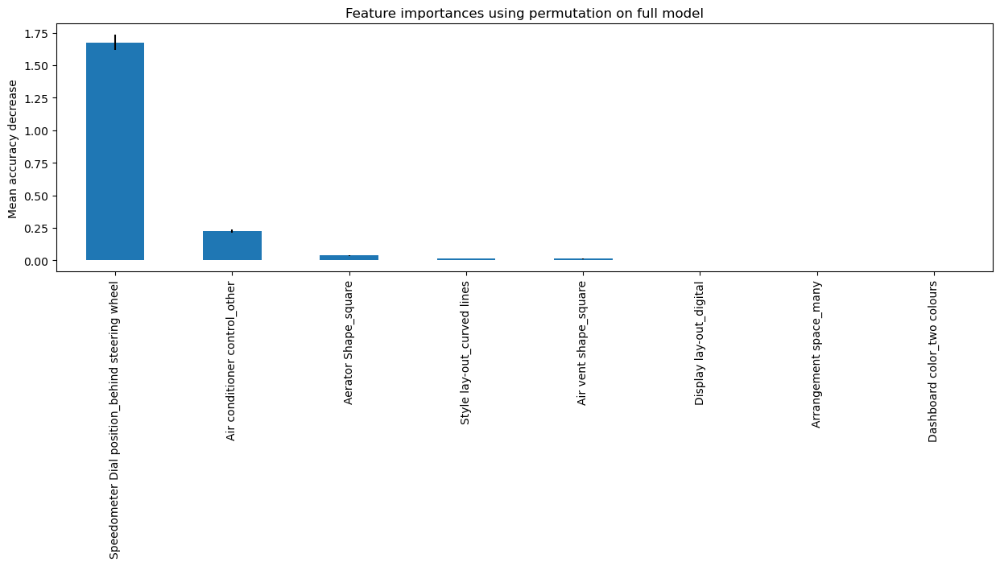

In [51]:
#Extract the importance_mean, Sort them and get the index of the sorted data
sorted_forest_importances_mean = pd.Series(result.importances_mean, index=feature_names).sort_values(ascending=False)
sorted_index3 = sorted_forest_importances_mean.index

#Extract the importance std
forest_importances_std = pd.Series(result.importances_std, index=feature_names)

#plot sorted data
#yerr allow to represent the std in order to ass the statistical relevant of the importance
pos = np.arange(sorted_index3.shape[0]) + 0.5


fig, ax = plt.subplots()
sorted_forest_importances_mean.plot.bar(pos,yerr=forest_importances_std[sorted_index3], ax=ax, align='center')

ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.set_figheight(4)
fig.set_figwidth(15)
#fig.tight_layout()
plt.show()


On mesure le poids de chaque variable dans notre modèle de forêt aléatoire en utilisant la méthode "permutation_importance", en évaluant la dégradation de la performance du modèle lorsque les valeurs d'une caractéristique sont mélangées aléatoirement. L'opération est répétée 10 fois. La Speedometer Dial position apparaît encore une fois comme une variable clé dans notre modèle de forêt aléatoire.

In [52]:
idx = sorted_forest_importances_mean.index
forest_importances[idx].head()

Speedometer Dial position_behind steering wheel    1.674125
Air conditioner control_other                      0.227125
Aerator Shape_square                               0.037253
Style lay-out_curved lines                         0.014228
Air vent shape_square                              0.012856
dtype: float64

### Using SHAP (SHapley Additive exPlanations) Values to assess and interpret the features impact

The bar chart above tells us what are the main important feature for the prediction, but doesn't tell us how these features influence the target variable. 

SHAP measures the impact of variables taking into account the interaction with other variables.
Shapley values calculate the importance of a feature by comparing what a model predicts with and without the feature. However, since the order in which a model sees features can affect its predictions, this is done in every possible order, so that the features are fairly compared. see this link for more detailms https://blog.datascienceheroes.com/how-to-interpret-shap-values-in-r/

The SHAP interpretation can be used (it is model-agnostic) to compute the feature importances from the Random Forest. It is using the Shapley values from game theory to estimate the how does each feature contribute to the prediction. It can be easily installed (pip install shap) and used with scikit-learn Random Forest:

In [55]:
import shap
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


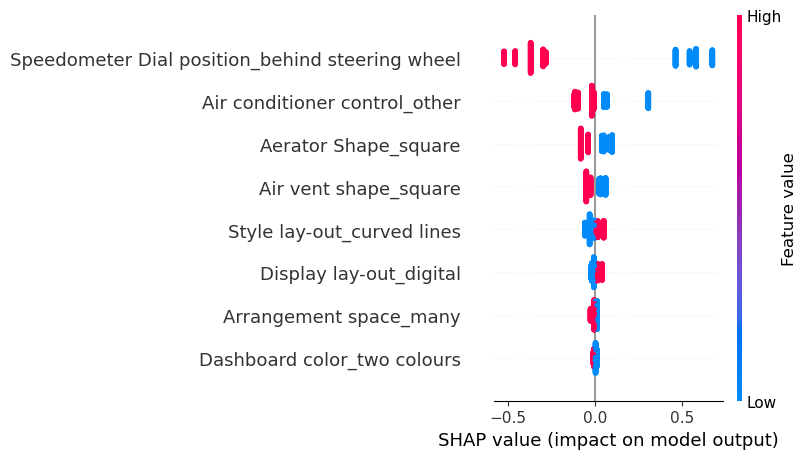

In [56]:
shap.summary_plot (shap_values, X_test, max_display=X_test.shape[1]) 

Encore une fois, le Speedometer Dial Position est la variable avec la valeur SHAP la plus séparée et étendue, elle va donc être prépondérante dans le parcours de notre arbre de décision.